In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import mean
from wordcloud import WordCloud,STOPWORDS
from matplotlib import pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from IPython.display import display

In [2]:
dsent = pd.read_csv('dsent.csv', low_memory = False)
display(dsent)

,Unnamed: 0,Unnamed: 0.1,review_id,user_id,business_id,stars_x,useful_x,funny_x,cool_x,text,...,Ambience_casual,BP_garage,BP_street,BP_validated,BP_lot,BP_valet,text_upr,lemmatized,lemma_str,sentiment
0,0,0,Gi5LSRmTXoL9Bp4jNGPjLw,hn0ZbitvmlHnF--KJGJ6_A,TA1KUSCu8GkWP9w0rmElxw,4,0,0,0,I have been here twice and have had really goo...,...,False,False,False,False,True,False,"['I', 'have', 'been', 'here', 'twice', 'and', ...","['twice', 'really', 'good', 'food', 'service',...",twice really good food service time get burger...,0.182259
1,1,1,egHMQBhFeaLhVyC6w3r0vQ,HvpNr0ohHCaVLp014CQrdw,gGvNgShksetPoimyKV8I9Q,4,0,0,0,Quickly stopped in for a UFC fight. I sat down...,...,True,False,False,False,False,True,"['Quickly', 'stopped', 'in', 'for', 'a', 'UFC'...","['quickly', 'stop', 'ufc', 'fight', 'sit', 'ba...",quickly stop ufc fight sit bar boyfriend park ...,0.288889
2,2,2,GDgXjXSZCA1iNQWD7OHXfg,1RCRKuHgP3FskGUVnmFdxg,mOnesB4IF9j6-ZmHoOHOig,4,0,0,0,I think their rice dishes are way better than ...,...,True,False,False,False,True,False,"['I', 'think', 'their', 'rice', 'dishes', 'are...","['think', 'rice', 'dish', 'way', 'well', 'pho'...",think rice dish way well pho 's also really li...,0.350000
3,3,3,WxrK52MRJy6Cxk_vOJeD1Q,9d22a-5XXvsZ55p04gI5jA,_gOz7-aHMyGUHOtjDrEv2w,2,4,2,0,"When we first arrived at the Coco Key, we were...",...,False,False,False,False,True,False,"['When', 'we', 'first', 'arrived', 'at', 'the'...","['first', 'arrive', 'coco', 'key', 'greet', 'n...",first arrive coco key greet number staff membe...,-0.071723
4,4,4,GgWFjRHhelaiUgR2-H6N4g,pRPT3vqhqpU7kHgmKJamvw,-_GnwXmzC3DXsHR9nyaC2g,3,0,0,0,3.5 stars! I got the avocado margarita and it ...,...,True,False,True,False,True,False,"['3.5', 'stars!', 'I', 'got', 'the', 'avocado'...","['3.5', 'star', 'get', 'avocado', 'margarita',...",3.5 star get avocado margarita delicious custo...,0.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
214869,214869,214869,Mc6gBUoqj8VNyGHBOTIPCw,_XXa8CyI4uKOdu6RRbWE4g,cs6HfZNykLVitm09jWFqWg,4,5,3,4,I went here for brunch with 2 friends on a Sun...,...,True,False,True,False,False,True,"['I', 'went', 'here', 'for', 'brunch', 'with',...","['go', 'brunch', '2', 'friend', 'sunday', 'awh...",go brunch 2 friend sunday awhile back buffet s...,0.500000
214870,214870,214870,jDMk2EEGG-fkuA2rnCr0zg,KTgetFhipsOG1vWfVuSaiA,cs6HfZNykLVitm09jWFqWg,5,0,0,0,Our group shared dinner entrees and side dishe...,...,True,False,True,False,False,True,"['Our', 'group', 'shared', 'dinner', 'entrees'...","['group', 'share', 'dinner', 'entree', 'side',...",group share dinner entree side dish best food ...,0.125000
214871,214871,214871,MbmrN5q_JKkokjOdqLXxhQ,SF2Hu55kX9QJDvZETuZ9eg,uXOVFQraz1va1TrtgiqYTg,4,0,0,0,This was a fun place to dine. It is a one chef...,...,True,False,True,False,False,False,"['This', 'was', 'a', 'fun', 'place', 'to', 'di...","['fun', 'place', 'dine', 'one', 'chef', 'kitch...",fun place dine one chef kitchen wait 1 hr get ...,0.362500
214872,214872,214872,2n2PbNLYlQSRs88VrZtrGg,_BwuIa1-qjIL1PdYB_awyA,Gzo1G_mMc2kpduvK2yQFYg,2,0,0,0,The food was ok. I order the pork bites and it...,...,True,False,False,False,True,False,"['The', 'food', 'was', 'ok.', 'I', 'order', 't...","['food', 'ok', 'order', 'pork', 'bite', 'good'...",food ok order pork bite good wife order combin...,-0.051852


In [3]:
slova = dsent.groupby('city')['lemma_str'].unique()
slova

city
Atlanta     [twice really good food service time get burge...
Austin      [think rice dish way well pho 's also really l...
Boston      [never year legal seafood dedication bad meal ...
Orlando     [first arrive coco key greet number staff memb...
Portland    [incredible donut sometimes go early full sele...
Name: lemma_str, dtype: object

In [4]:
atlanta = slova[0].astype(str)

#tady pro demonstraci je jednou ukázáno, jak následně "watlanta" vypadá, ostatní nejsou vyprintnutý, protože paměť

watlanta = ' '.join([str(elem) for elem in atlanta]) 
print(watlanta) 

twice really good food service time get burger caramelize onion red wine sauce believe blue cheese first time excellent right size hate go order burger big head even finish half flip 's burger size would make home second time go limited time seasonal offering venison burger pea shoot kind cheese remind brie sweet syrupy sauce could do without overall good also onion ring possibly best onion ring ever thing really like flip atmosphere layout table guess go trendy upscale whatever make feel school cafeteria back high school like long white table shove uncomfortable modern look plastic chair kind look like come ikea also pretty loud nothing absorb sound like school cafeteria last time couple woman small child idea someone would bring child flip unless child adventerous eater make anything plain everything menu pretty exotic ingredient also pricy burger last place earth would bring kid eat burger king right street quickly stop ufc fight sit bar boyfriend park car although restaurant/bar pa

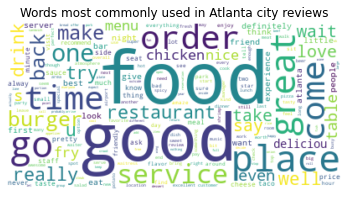

In [5]:
word_cloud_atlanta = WordCloud(collocations = False, background_color = 'white').generate(watlanta)

plt.imshow(word_cloud_atlanta, interpolation='bilinear')
plt.axis("off")
plt.title('Words most commonly used in Atlanta city reviews')
plt.savefig('atlanta.png')
plt.show()

In [19]:
austin = slova[1].astype(str)

waustin = ' '.join([str(elem) for elem in austin])  

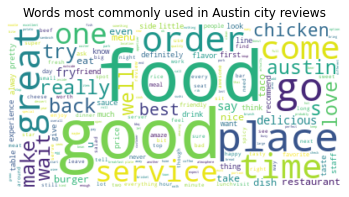

In [7]:
word_cloud_austin = WordCloud(collocations = False, background_color = 'white').generate(waustin)

plt.imshow(word_cloud_austin, interpolation='bilinear')
plt.axis("off")
plt.title('Words most commonly used in Austin city reviews')
plt.savefig('austin.png')
plt.show()

In [18]:
boston = slova[2].astype(str)

wboston = ' '.join([str(elem) for elem in boston])  

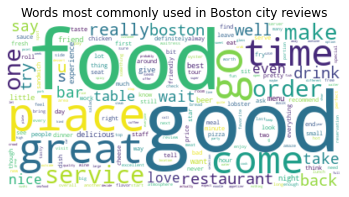

In [9]:
word_cloud_boston = WordCloud(collocations = False, background_color = 'white').generate(wboston)

plt.imshow(word_cloud_boston, interpolation='bilinear')
plt.axis("off")
plt.title('Words most commonly used in Boston city reviews')
plt.savefig('boston.png')
plt.show()

In [17]:
orlando = slova[3].astype(str)

worlando = ' '.join([str(elem) for elem in orlando])

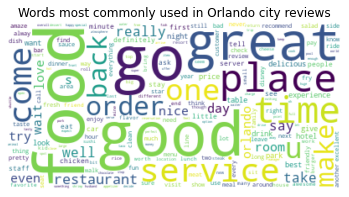

In [11]:
word_cloud_orlando = WordCloud(collocations = False, background_color = 'white').generate(worlando)

plt.imshow(word_cloud_orlando, interpolation='bilinear')
plt.axis("off")
plt.title('Words most commonly used in Orlando city reviews')
plt.savefig('orlando.png')
plt.show()

In [16]:
portland = slova[4].astype(str)

wportland = ' '.join([str(elem) for elem in portland])

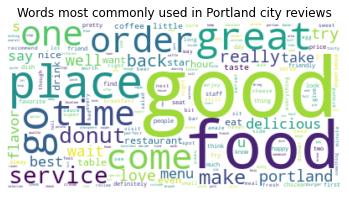

In [13]:
word_cloud_portland = WordCloud(collocations = False, background_color = 'white').generate(wportland)

plt.imshow(word_cloud_portland, interpolation='bilinear')
plt.axis("off")
plt.title('Words most commonly used in Portland city reviews')
plt.savefig('portland.png')
plt.show()